In [1]:
import os
import numpy as np

from PIL import Image
import matplotlib.pyplot as plt

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR
from torchvision.transforms import functional as F
import torchvision.transforms as T
import torchvision.models as models
from torchvision.utils import make_grid

import random

from tqdm import tqdm

In [2]:
SEED = 1834579290

np.random.seed(SEED)
random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [3]:
class Conf:
    train_dir = '/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'
    val_dir = '/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/val'
    test_dir = '/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/test'

    batch_size = 16

    scaling_factor = 4
    x_patch_size = 24
    y_patch_size = scaling_factor * x_patch_size
    
    subset_size = 30000

In [4]:
class ImageDataset(Dataset):
    def __init__(self, image_dir, x_patch_size, y_patch_size, train_set=False):
        self.image_dir = image_dir
        self.x_patch_size = x_patch_size
        self.y_patch_size = y_patch_size
        self.train_set = train_set

        self.to_tensor = T.ToTensor()
        
        if self.train_set:
            subdirs = [os.path.join(image_dir, d) for d in os.listdir(image_dir) 
                       if os.path.isdir(os.path.join(image_dir, d))]

            self.image_paths = []
            for d in subdirs:
                for fname in os.listdir(d):
                    if fname.lower().endswith(('.png', '.jpg', '.jpeg')):
                        self.image_paths.append(os.path.join(d, fname))
        else:
            self.image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir)
                                if fname.lower().endswith(('.png', '.jpg', '.jpeg'))]

        self.image_paths = self.image_paths[:Conf.subset_size]
        self.image_paths.sort()

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        w, h = image.size

        if (w < self.y_patch_size or h < self.y_patch_size):
            image = image.resize((self.y_patch_size, self.y_patch_size), Image.BICUBIC)
            w, h = image.size

        if self.train_set:
            x1 = random.randint(0, w - self.y_patch_size)
            y1 = random.randint(0, h - self.y_patch_size)
        else:
            x1 = (w - self.y_patch_size) // 2
            y1 = (h - self.y_patch_size) // 2

        y_patch = image.crop((x1, y1, x1 + self.y_patch_size, y1 + self.y_patch_size))
        x_patch = y_patch.resize((self.x_patch_size, self.x_patch_size), Image.BICUBIC)

        x_tensor = self.to_tensor(x_patch)
        y_tensor = self.to_tensor(y_patch)

        y_tensor = y_tensor * 2.0 - 1.0
        
        return x_tensor, y_tensor

In [5]:
%%time

train_dataset = ImageDataset(Conf.train_dir, Conf.x_patch_size, Conf.y_patch_size, True)
val_dataset = ImageDataset(Conf.val_dir, Conf.x_patch_size, Conf.y_patch_size)
test_dataset = ImageDataset(Conf.val_dir, Conf.x_patch_size, Conf.y_patch_size)

train_loader = DataLoader(train_dataset, batch_size = Conf.batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size = Conf.batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size = Conf.batch_size, shuffle=False)

CPU times: user 1.81 s, sys: 819 ms, total: 2.63 s
Wall time: 22.2 s


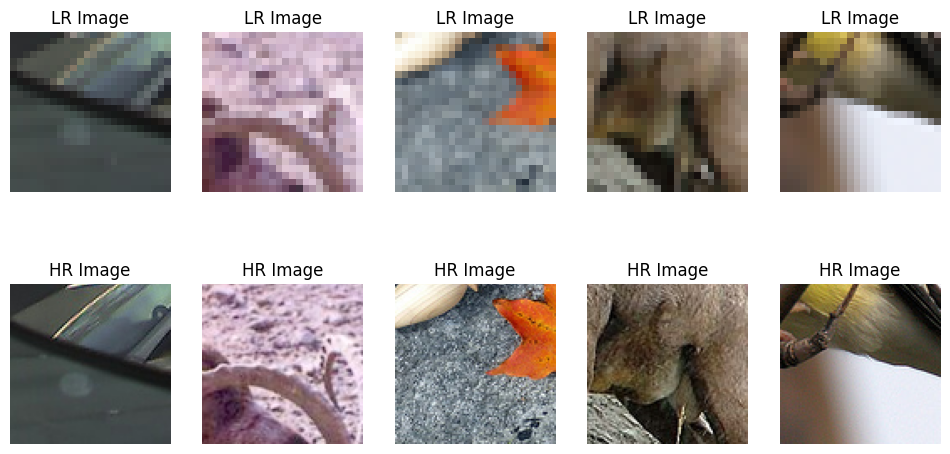

In [6]:
def display_samples(loader, num_samples=5):
    samples_displayed = 0
    plt.figure(figsize=(12, 6))
    for x, y in loader:
        for i in range(x.size(0)):
            if samples_displayed >= num_samples:
                plt.show()
                return
            
            plt.subplot(2, num_samples, samples_displayed + 1)
            plt.imshow(x[i].permute(1, 2, 0).numpy())
            plt.title("LR Image")
            plt.axis('off')

            plt.subplot(2, num_samples, samples_displayed + 1 + num_samples)
            plt.imshow(((y + 1) / 2.0)[i].permute(1, 2, 0).numpy(), cmap='gray')
            plt.title("HR Image")
            plt.axis('off')
            
            samples_displayed += 1

display_samples(train_loader)

In [7]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(channels)
        )
    
    def forward(self, x):
        return x + self.block(x)

class SRResNet(nn.Module):
    def __init__(self, num_channels=3, num_blocks=16, upscale_factor=4):
        super(SRResNet, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(num_channels, 64, kernel_size=9, stride=1, padding=4),
            nn.ReLU(inplace=True)
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_blocks)]
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64)
        )

        self.upscale = nn.Sequential(
            nn.Conv2d(64, 64 * upscale_factor, kernel_size=3, stride=1, padding=1),
            nn.PixelShuffle(int(np.sqrt(upscale_factor))),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64 * upscale_factor, kernel_size=3, stride=1, padding=1),
            nn.PixelShuffle(int(np.sqrt(upscale_factor))),
            nn.ReLU(inplace=True),
        )

        self.conv3 = nn.Sequential(
            nn.Conv2d(64, num_channels, kernel_size=9, stride=1, padding=4),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.conv1(x)
        residual = self.res_blocks(x)
        x = self.conv2(residual) + x
        x = self.upscale(x)
        x = self.conv3(x)
        return x

In [8]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3):
        super(ConvBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        )

    def forward(self, x):
        return self.block(x)

class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(Discriminator, self).__init__()
        
        self.layers = nn.Sequential(
            ConvBlock(in_channels, 64, kernel_size=3),
            ConvBlock(64, 128, kernel_size=3),
            ConvBlock(128, 256, kernel_size=3),
            ConvBlock(256, 512, kernel_size=3),
            ConvBlock(512, 512, kernel_size=3),
            
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.layers(x)

In [9]:
class VGG19(nn.Module):
    def __init__(self, feature_layer='relu5_4'):
        super(VGG19, self).__init__()
        self.vgg = self._load_vgg()
        self.feature_layer = self._get_layer_index(feature_layer)
        self.criterion = nn.MSELoss()

        for param in self.vgg.parameters():
            param.requires_grad = False

    def _load_vgg(self):
        vgg = models.vgg19(pretrained=True).features
        return vgg

    def _get_layer_index(self, layer_name):
        layer_mapping = {
            'relu1_1': 1, 'relu1_2': 3,
            'relu2_1': 6, 'relu2_2': 8,
            'relu3_1': 11, 'relu3_2': 13, 'relu3_4': 17,
            'relu4_1': 20, 'relu4_2': 22, 'relu4_4': 26,
            'relu5_1': 29, 'relu5_2': 31, 'relu5_4': 35
        }
        return layer_mapping[layer_name]

    def forward(self, input_image, target):
        input_image = self._vgg_preprocess(input_image)
        target = self._vgg_preprocess(target)

        input_features = self._extract_features(input_image)
        target_features = self._extract_features(target)
        
        loss = self.criterion(input_features, target_features)
        return loss

    def _extract_features(self, x):
        for idx, layer in enumerate(self.vgg):
            if idx == self.feature_layer: # Taking features before ReLU5_4 (idea from ESRGAN paper)
                break
            x = layer(x)
        return x

    def _vgg_preprocess(self, x):
        mean = torch.tensor([0.485, 0.456, 0.406], device=x.device).view(1, 3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225], device=x.device).view(1, 3, 1, 1)
        return (x - mean) / std

In [10]:
class AdversarialLoss(nn.Module):
    def __init__(self):
        super(AdversarialLoss, self).__init__()

    def forward(self, discriminator_output):
        loss = -torch.log(discriminator_output + 1e-8).mean()
        return loss

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

generator = SRResNet(num_channels=3, num_blocks=16, upscale_factor=Conf.scaling_factor).to(device)
discriminator = Discriminator(in_channels=3).to(device)

vgg_loss = VGG19(feature_layer='relu5_4').to(device)
adversarial_loss = AdversarialLoss()

bce_loss = nn.BCELoss()

optimizer_G = optim.Adam(generator.parameters(), lr=1e-4, betas=(0.9, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=1e-4, betas=(0.9, 0.999))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 201MB/s]


In [12]:
generator.load_state_dict(torch.load('/kaggle/input/srresnet/SRResNet.pth', map_location=device))

<ipython-input-12-75636da49fb7>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load('/kaggle/input/srresnet/SRResNet.pth', map_location=dev

<All keys matched successfully>

In [13]:
def display_images(low_res, super_res, high_res, epoch):
    low_res = low_res[0].permute(1, 2, 0).cpu().clamp(0, 1)
    super_res = ((super_res[0].permute(1, 2, 0).cpu().clamp(-1, 1) + 1) / 2.0)
    high_res = ((high_res[0].permute(1, 2, 0).cpu().clamp(-1, 1) + 1) / 2.0)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.title("Low-Resolution")
    plt.imshow(low_res)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Super-Resolution (Generated)")
    plt.imshow(super_res)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("High-Resolution (Ground Truth)")
    plt.imshow(high_res)
    plt.axis('off')

    plt.suptitle(f"Validation Results - Epoch {epoch+1}")
    plt.show()

Validation: 100%|██████████| 1875/1875 [08:08<00:00,  3.83it/s]


Epoch [1/50]
  Train D Loss: 0.6217, G Loss: 16.4334, Content Loss: 15.4423, Adv Loss: 0.9911
  Val   D Loss: 0.3634, Content Loss: 23.6309, Adv Loss: 1.0990


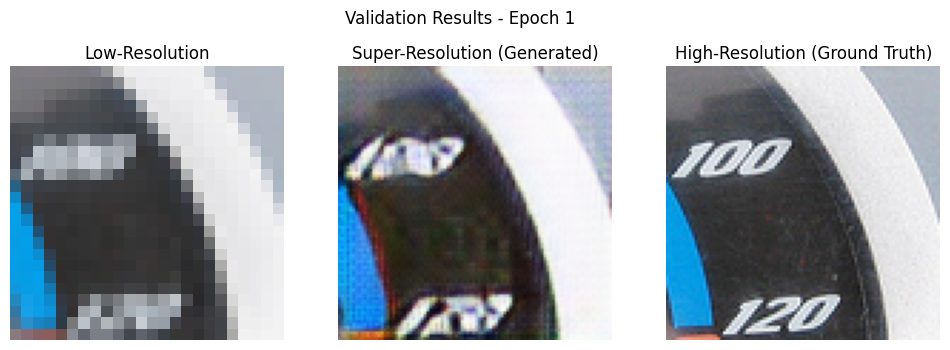

Validation: 100%|██████████| 1875/1875 [03:32<00:00,  8.83it/s]


Epoch [2/50]
  Train D Loss: 0.5653, G Loss: 16.3978, Content Loss: 15.0801, Adv Loss: 1.3177
  Val   D Loss: 0.4378, Content Loss: 24.6405, Adv Loss: 1.6733


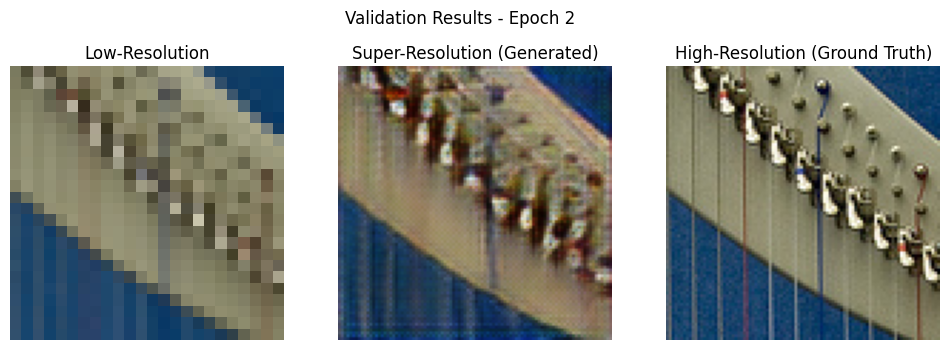

Saved checkpoints at epoch 2


Validation: 100%|██████████| 1875/1875 [03:29<00:00,  8.94it/s]


Epoch [3/50]
  Train D Loss: 0.5257, G Loss: 16.2928, Content Loss: 14.9094, Adv Loss: 1.3834
  Val   D Loss: 0.3785, Content Loss: 24.1281, Adv Loss: 1.2540


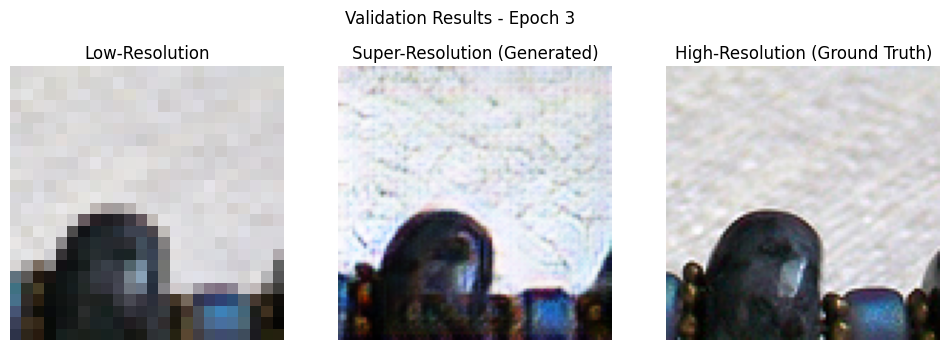

Validation: 100%|██████████| 1875/1875 [03:38<00:00,  8.58it/s]


Epoch [4/50]
  Train D Loss: 0.4465, G Loss: 16.8929, Content Loss: 15.1480, Adv Loss: 1.7450
  Val   D Loss: 0.4222, Content Loss: 23.9033, Adv Loss: 1.3078


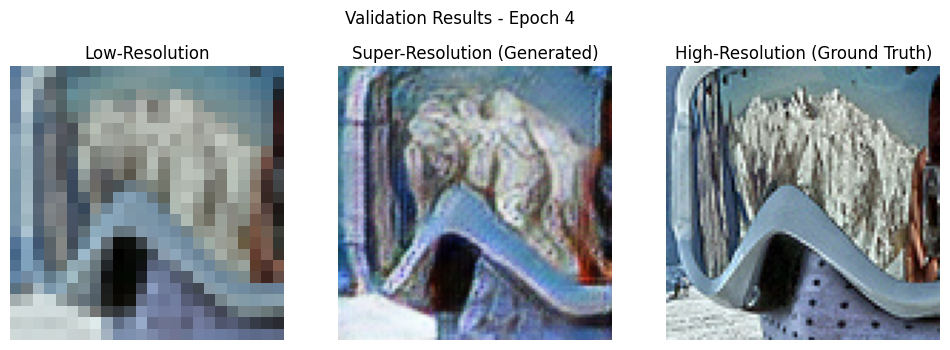

Saved checkpoints at epoch 4


Validation: 100%|██████████| 1875/1875 [03:24<00:00,  9.15it/s]


Epoch [5/50]
  Train D Loss: 0.4418, G Loss: 16.9977, Content Loss: 15.1254, Adv Loss: 1.8722
  Val   D Loss: 0.2736, Content Loss: 24.3843, Adv Loss: 2.2754


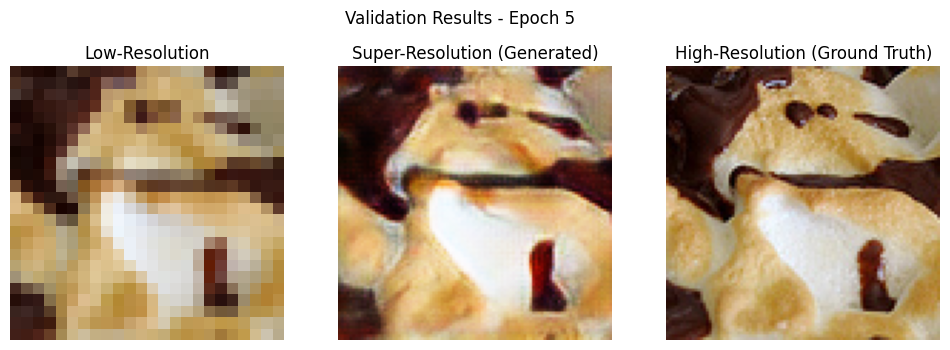

Validation: 100%|██████████| 1875/1875 [03:25<00:00,  9.12it/s]


Epoch [6/50]
  Train D Loss: 0.4446, G Loss: 16.9973, Content Loss: 15.1056, Adv Loss: 1.8917
  Val   D Loss: 0.4769, Content Loss: 24.0605, Adv Loss: 0.9986


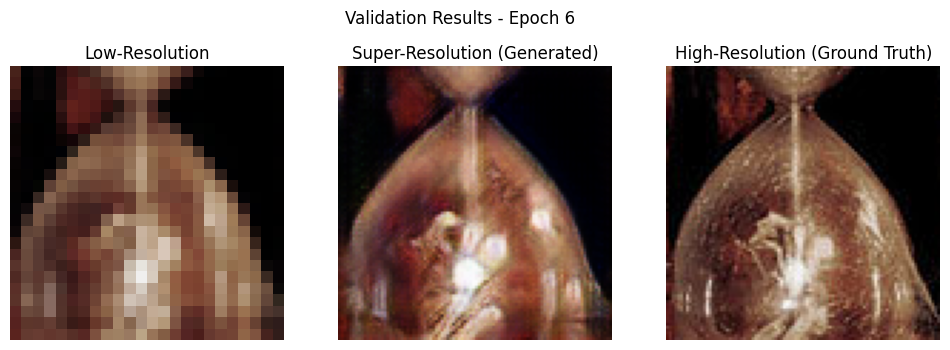

Saved checkpoints at epoch 6


Validation: 100%|██████████| 1875/1875 [03:23<00:00,  9.20it/s]


Epoch [7/50]
  Train D Loss: 0.4159, G Loss: 17.0379, Content Loss: 15.0687, Adv Loss: 1.9693
  Val   D Loss: 0.2943, Content Loss: 24.2487, Adv Loss: 1.8599


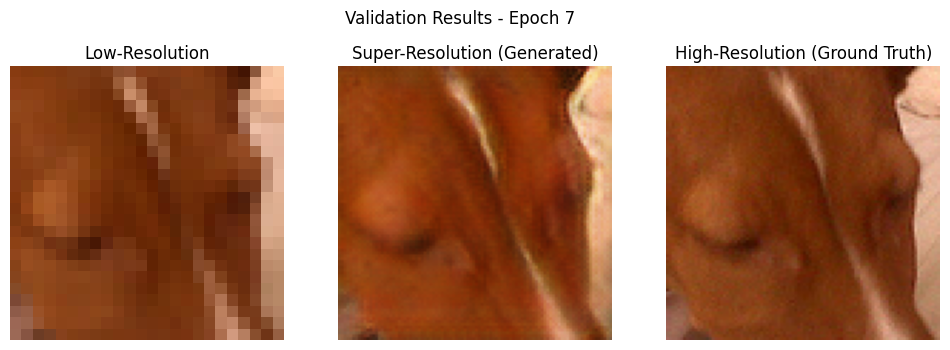

Validation: 100%|██████████| 1875/1875 [03:24<00:00,  9.17it/s]


Epoch [8/50]
  Train D Loss: 0.4174, G Loss: 17.2658, Content Loss: 15.2347, Adv Loss: 2.0311
  Val   D Loss: 0.3409, Content Loss: 23.6414, Adv Loss: 1.3873


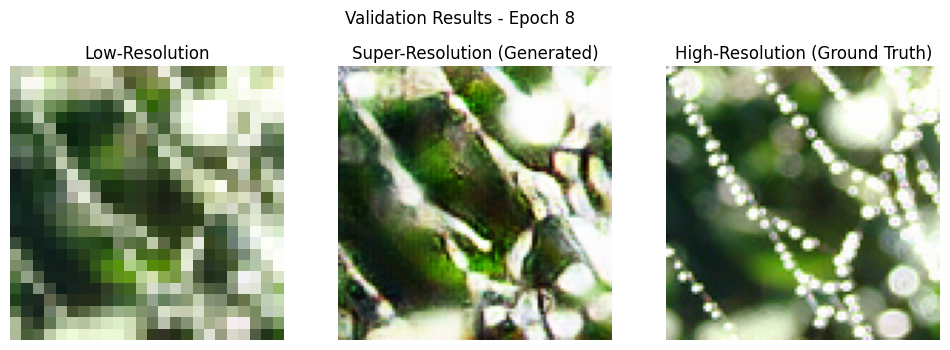

Saved checkpoints at epoch 8


Validation: 100%|██████████| 1875/1875 [03:27<00:00,  9.02it/s]


Epoch [9/50]
  Train D Loss: 0.3678, G Loss: 17.2170, Content Loss: 14.9850, Adv Loss: 2.2320
  Val   D Loss: 0.2084, Content Loss: 24.0726, Adv Loss: 2.5393


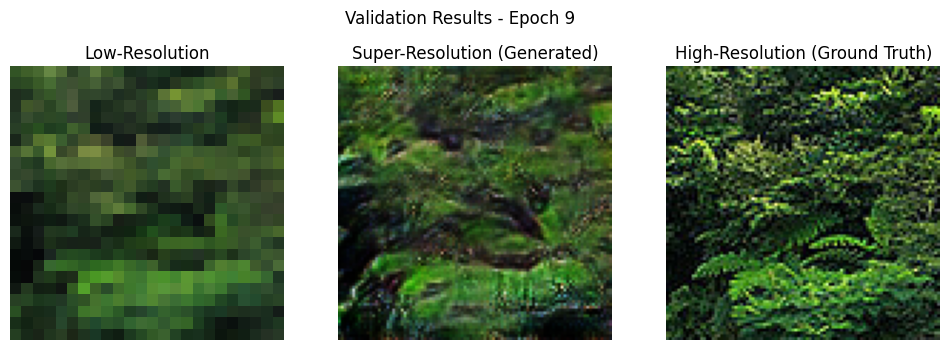

Validation: 100%|██████████| 1875/1875 [03:27<00:00,  9.04it/s]


Epoch [10/50]
  Train D Loss: 0.3667, G Loss: 17.4207, Content Loss: 15.0771, Adv Loss: 2.3436
  Val   D Loss: 0.3036, Content Loss: 24.0703, Adv Loss: 2.4389


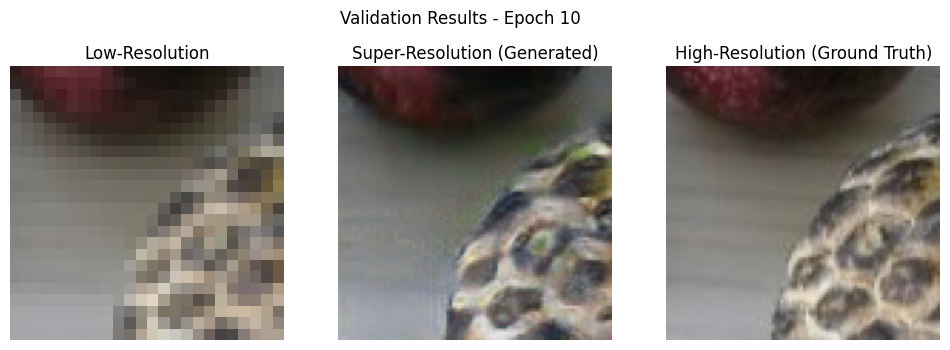

Saved checkpoints at epoch 10


Validation: 100%|██████████| 1875/1875 [03:27<00:00,  9.02it/s]


Epoch [11/50]
  Train D Loss: 0.3373, G Loss: 17.2985, Content Loss: 14.9285, Adv Loss: 2.3700
  Val   D Loss: 0.2689, Content Loss: 24.1419, Adv Loss: 3.0535


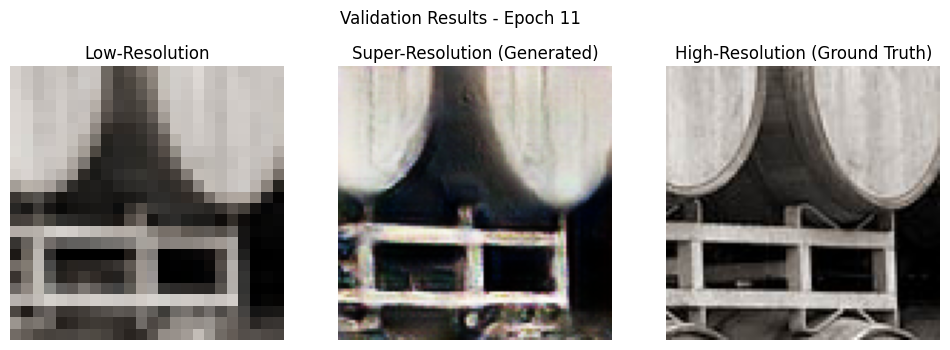

Validation: 100%|██████████| 1875/1875 [03:38<00:00,  8.57it/s]


Epoch [12/50]
  Train D Loss: 0.3428, G Loss: 17.4208, Content Loss: 15.0258, Adv Loss: 2.3950
  Val   D Loss: 0.3476, Content Loss: 24.8366, Adv Loss: 1.7698


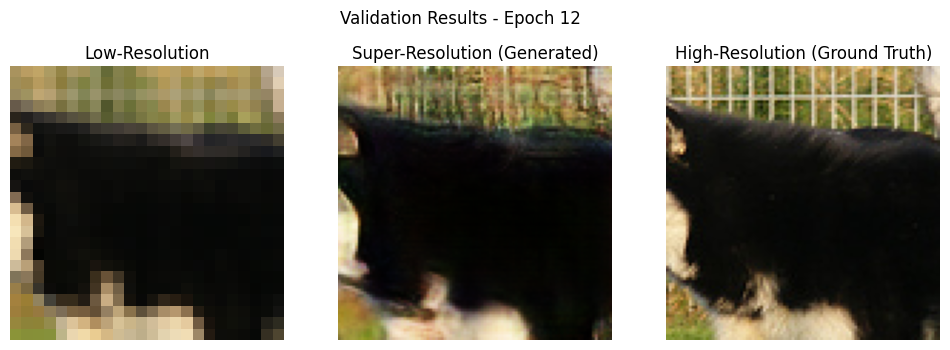

Saved checkpoints at epoch 12


Validation: 100%|██████████| 1875/1875 [03:34<00:00,  8.74it/s]


Epoch [13/50]
  Train D Loss: 0.3432, G Loss: 17.2688, Content Loss: 14.8188, Adv Loss: 2.4500
  Val   D Loss: 0.3096, Content Loss: 24.3641, Adv Loss: 2.6676


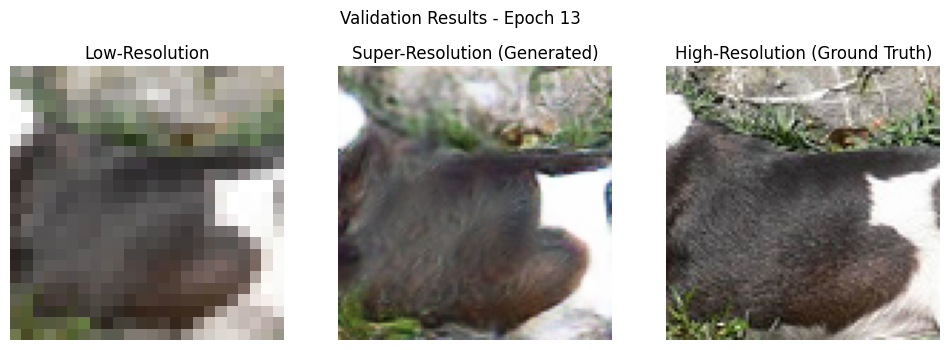

Validation: 100%|██████████| 1875/1875 [03:24<00:00,  9.19it/s]


Epoch [14/50]
  Train D Loss: 0.3443, G Loss: 17.4024, Content Loss: 14.9209, Adv Loss: 2.4815
  Val   D Loss: 0.2723, Content Loss: 23.8727, Adv Loss: 3.3996


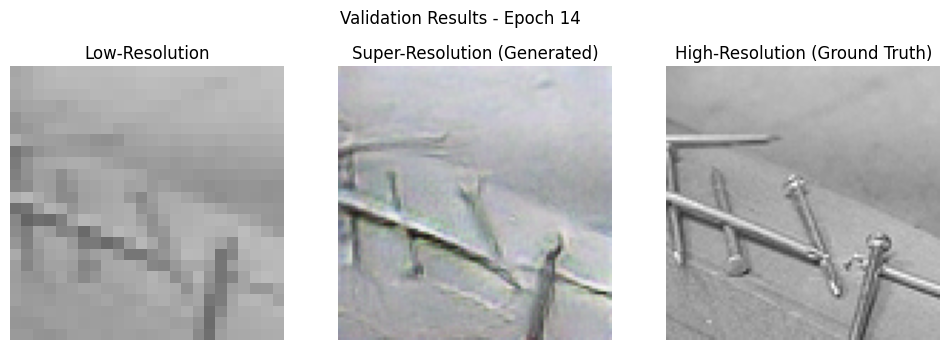

Saved checkpoints at epoch 14


Validation: 100%|██████████| 1875/1875 [03:28<00:00,  9.01it/s]


Epoch [15/50]
  Train D Loss: 0.3263, G Loss: 17.3563, Content Loss: 14.7950, Adv Loss: 2.5613
  Val   D Loss: 0.2858, Content Loss: 24.2086, Adv Loss: 3.3666


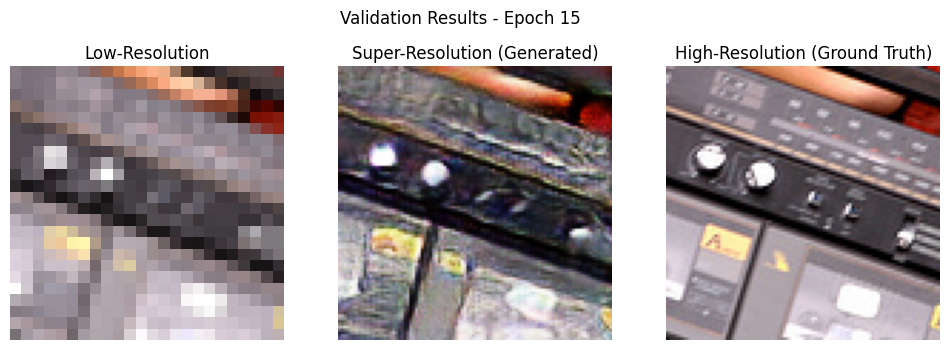

Validation: 100%|██████████| 1875/1875 [03:24<00:00,  9.15it/s]


Epoch [16/50]
  Train D Loss: 0.2833, G Loss: 17.6173, Content Loss: 14.7866, Adv Loss: 2.8306
  Val   D Loss: 0.2781, Content Loss: 23.7301, Adv Loss: 3.7961


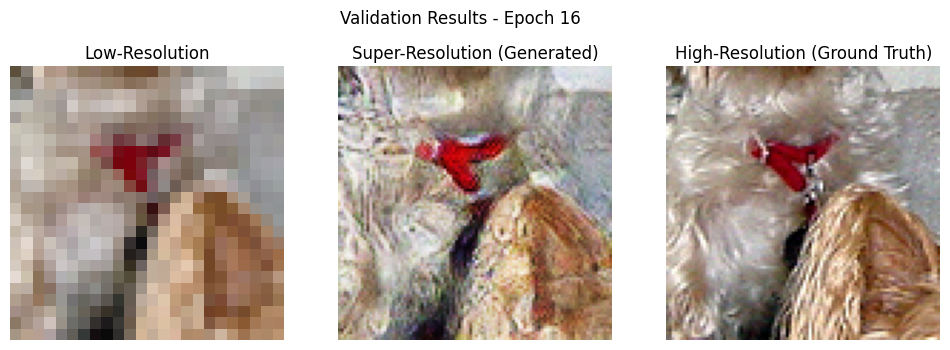

Saved checkpoints at epoch 16


Validation: 100%|██████████| 1875/1875 [03:53<00:00,  8.02it/s]


Epoch [17/50]
  Train D Loss: 0.2576, G Loss: 17.6331, Content Loss: 14.6760, Adv Loss: 2.9571
  Val   D Loss: 0.2744, Content Loss: 23.7513, Adv Loss: 2.6399


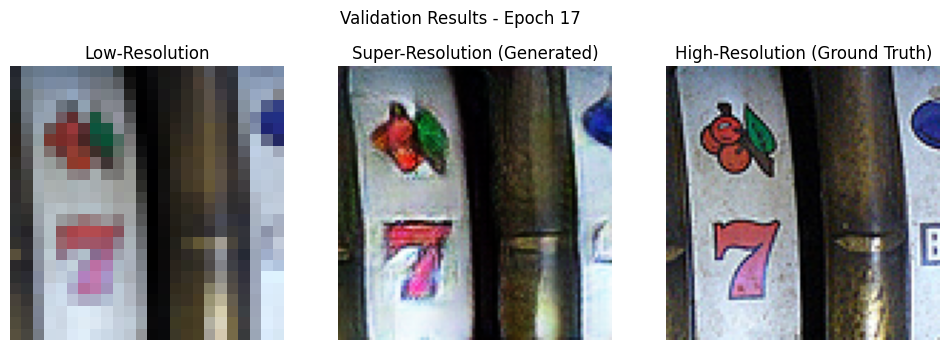

Validation: 100%|██████████| 1875/1875 [03:28<00:00,  9.01it/s]


Epoch [18/50]
  Train D Loss: 0.2267, G Loss: 18.0241, Content Loss: 14.8252, Adv Loss: 3.1989
  Val   D Loss: 0.1457, Content Loss: 23.6296, Adv Loss: 3.2480


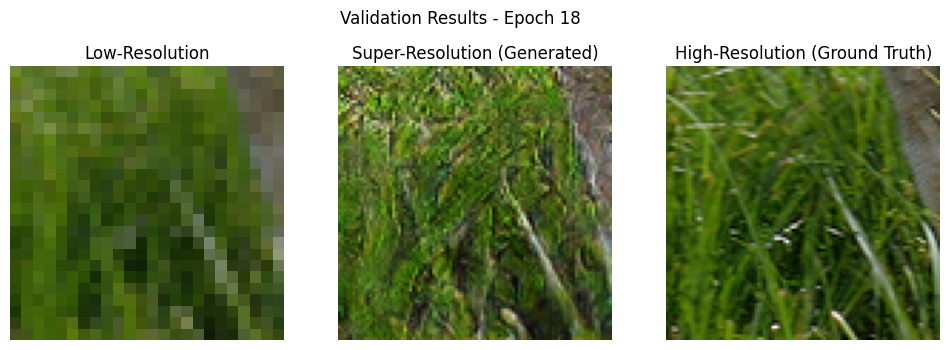

Saved checkpoints at epoch 18


Validation: 100%|██████████| 1875/1875 [03:44<00:00,  8.36it/s]


Epoch [19/50]
  Train D Loss: 0.2167, G Loss: 18.0700, Content Loss: 14.8022, Adv Loss: 3.2678
  Val   D Loss: 0.1772, Content Loss: 23.5877, Adv Loss: 5.2667


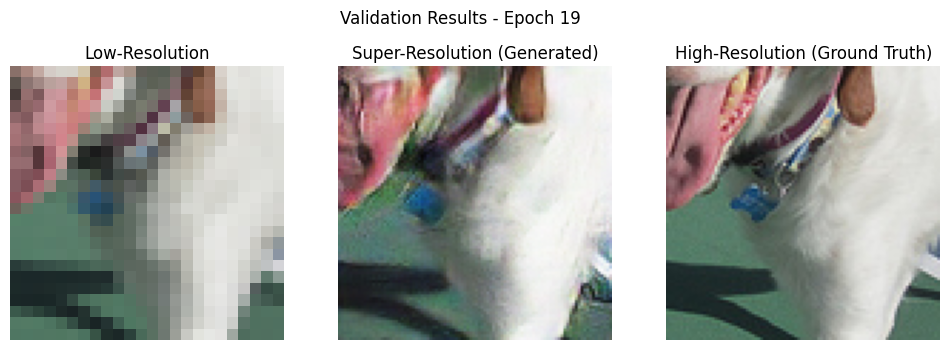

Validation: 100%|██████████| 1875/1875 [03:26<00:00,  9.07it/s]


Epoch [20/50]
  Train D Loss: 0.2055, G Loss: 18.1647, Content Loss: 14.7451, Adv Loss: 3.4196
  Val   D Loss: 0.2886, Content Loss: 23.5382, Adv Loss: 4.5483


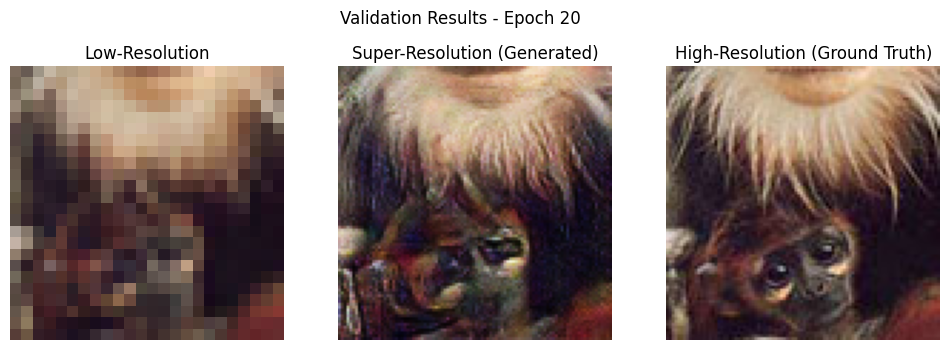

Saved checkpoints at epoch 20


Validation: 100%|██████████| 1875/1875 [03:31<00:00,  8.88it/s]


Epoch [21/50]
  Train D Loss: 0.1968, G Loss: 18.0831, Content Loss: 14.6548, Adv Loss: 3.4283
  Val   D Loss: 0.1466, Content Loss: 23.2997, Adv Loss: 3.9545


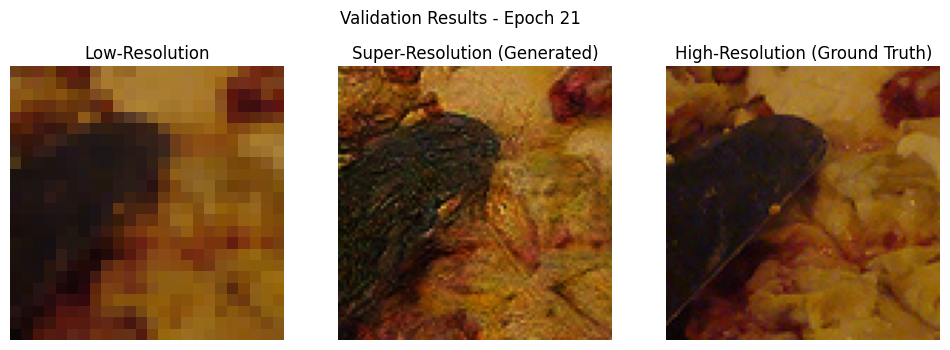

Validation: 100%|██████████| 1875/1875 [03:24<00:00,  9.15it/s]


Epoch [22/50]
  Train D Loss: 0.1884, G Loss: 18.2271, Content Loss: 14.6886, Adv Loss: 3.5385
  Val   D Loss: 0.1575, Content Loss: 23.1482, Adv Loss: 4.5335


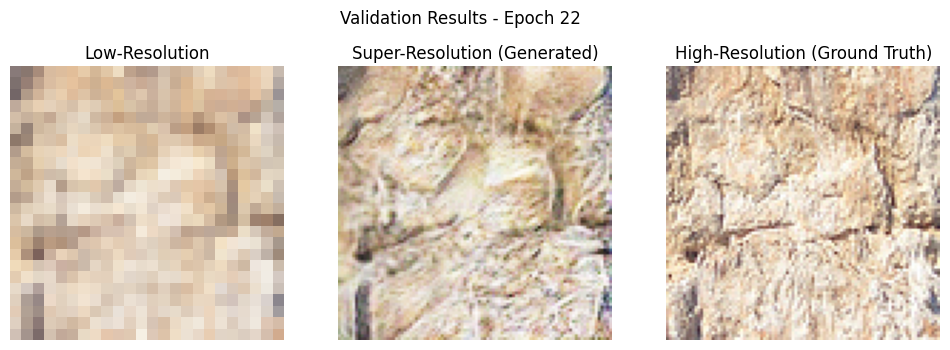

Saved checkpoints at epoch 22


Validation: 100%|██████████| 1875/1875 [03:28<00:00,  8.99it/s]


Epoch [23/50]
  Train D Loss: 0.1741, G Loss: 18.1638, Content Loss: 14.5395, Adv Loss: 3.6243
  Val   D Loss: 0.1352, Content Loss: 23.8526, Adv Loss: 3.4451


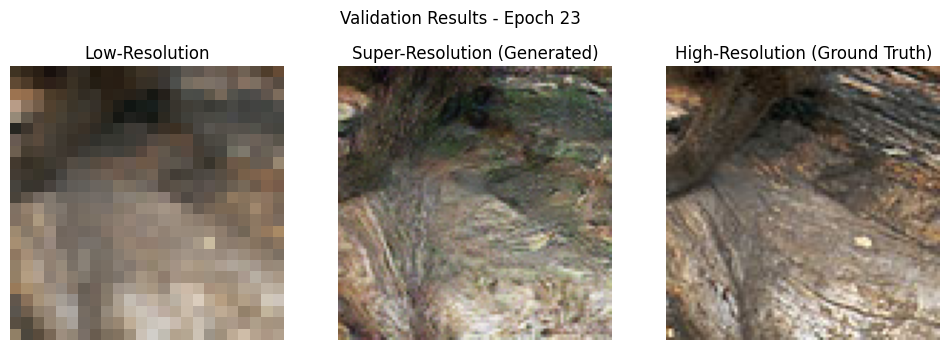

Validation: 100%|██████████| 1875/1875 [03:28<00:00,  9.01it/s]


Epoch [24/50]
  Train D Loss: 0.1698, G Loss: 18.4222, Content Loss: 14.6888, Adv Loss: 3.7334
  Val   D Loss: 0.1380, Content Loss: 23.6772, Adv Loss: 4.0508


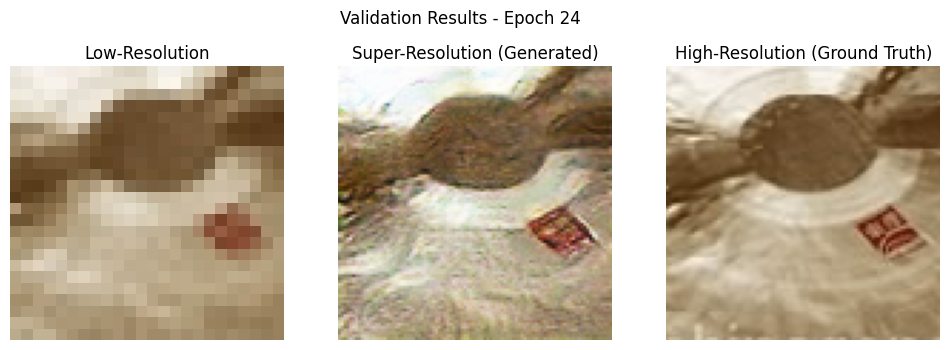

Saved checkpoints at epoch 24


Validation: 100%|██████████| 1875/1875 [03:26<00:00,  9.10it/s]


Epoch [25/50]
  Train D Loss: 0.1720, G Loss: 18.2813, Content Loss: 14.5398, Adv Loss: 3.7415
  Val   D Loss: 0.1851, Content Loss: 23.0881, Adv Loss: 5.3203


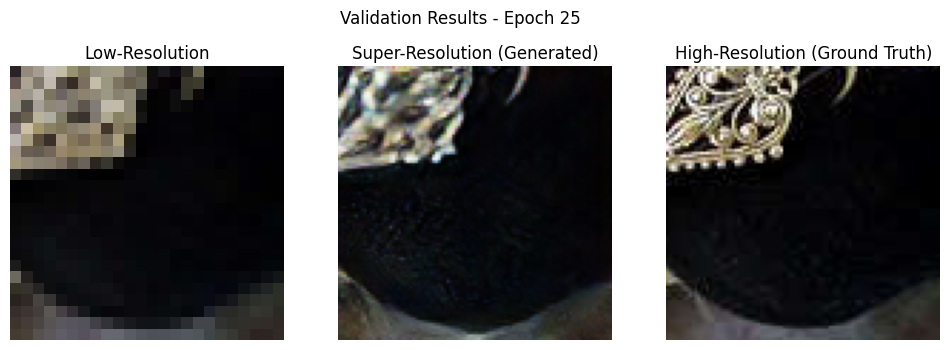

Validation: 100%|██████████| 1875/1875 [03:27<00:00,  9.02it/s]


Epoch [26/50]
  Train D Loss: 0.1596, G Loss: 18.3587, Content Loss: 14.5624, Adv Loss: 3.7963
  Val   D Loss: 0.1006, Content Loss: 22.6434, Adv Loss: 4.2100


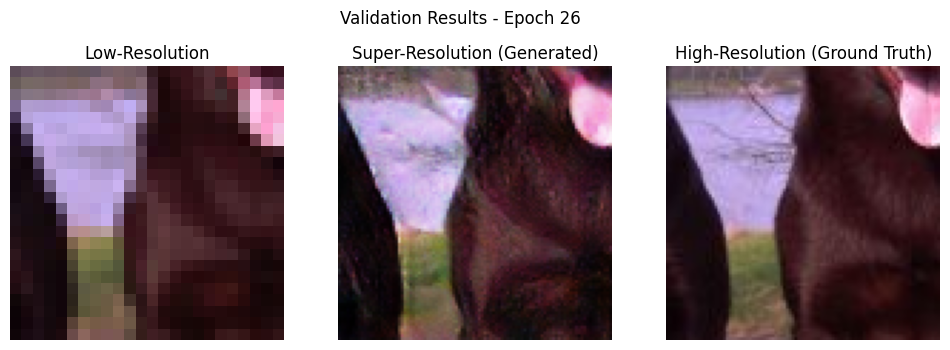

Saved checkpoints at epoch 26


Validation: 100%|██████████| 1875/1875 [03:25<00:00,  9.12it/s]


Epoch [27/50]
  Train D Loss: 0.1621, G Loss: 18.2340, Content Loss: 14.4557, Adv Loss: 3.7783
  Val   D Loss: 0.1285, Content Loss: 22.9693, Adv Loss: 4.2444


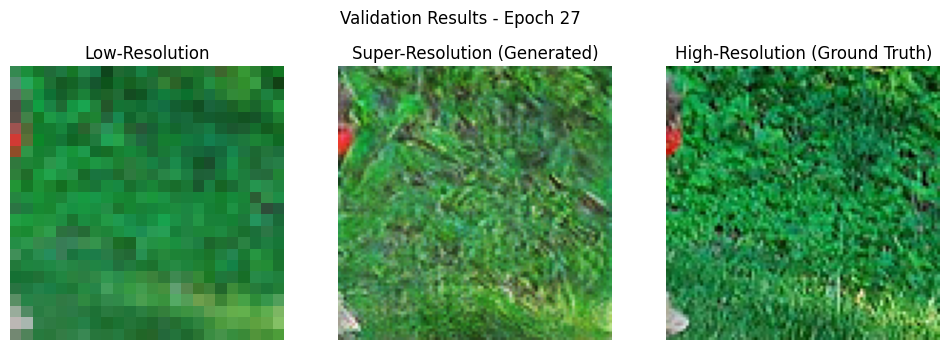

Validation: 100%|██████████| 1875/1875 [03:29<00:00,  8.96it/s]


Epoch [28/50]
  Train D Loss: 0.1666, G Loss: 18.1528, Content Loss: 14.3970, Adv Loss: 3.7558
  Val   D Loss: 0.1493, Content Loss: 22.8055, Adv Loss: 3.1591


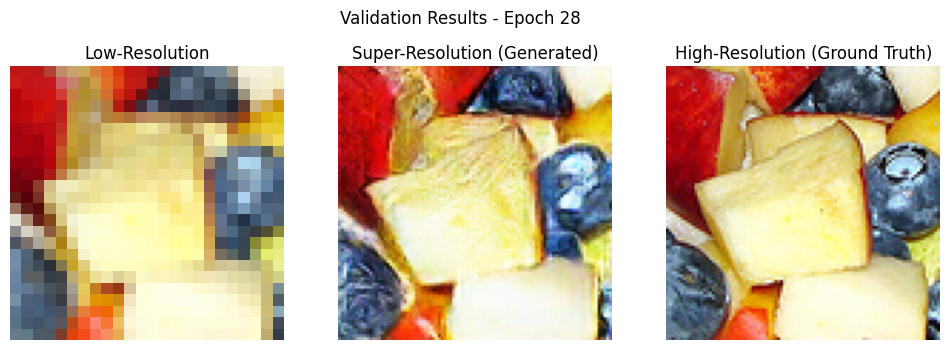

Saved checkpoints at epoch 28


Validation: 100%|██████████| 1875/1875 [03:24<00:00,  9.18it/s]


Epoch [29/50]
  Train D Loss: 0.1668, G Loss: 18.2833, Content Loss: 14.4752, Adv Loss: 3.8081
  Val   D Loss: 0.1171, Content Loss: 22.9804, Adv Loss: 4.5372


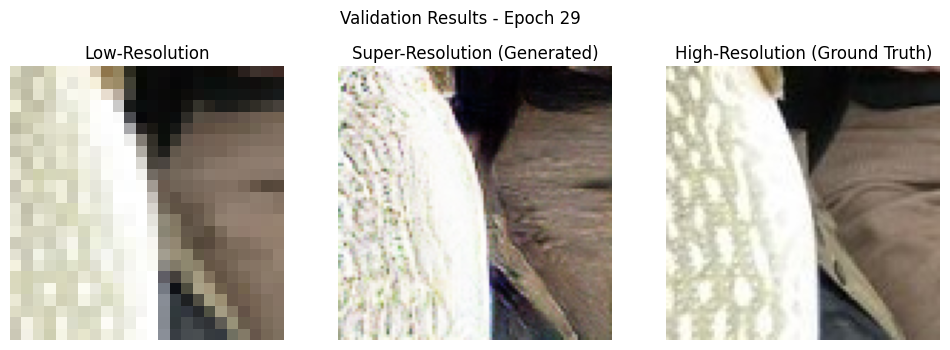

Validation: 100%|██████████| 1875/1875 [03:31<00:00,  8.87it/s]


Epoch [30/50]
  Train D Loss: 0.1751, G Loss: 18.0159, Content Loss: 14.2967, Adv Loss: 3.7192
  Val   D Loss: 0.1491, Content Loss: 22.9063, Adv Loss: 3.2302


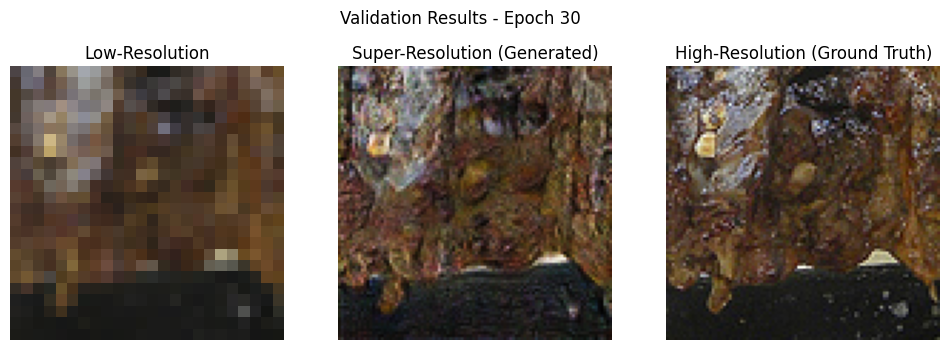

Saved checkpoints at epoch 30


Validation: 100%|██████████| 1875/1875 [03:27<00:00,  9.06it/s]


Epoch [31/50]
  Train D Loss: 0.1630, G Loss: 18.3658, Content Loss: 14.4874, Adv Loss: 3.8784
  Val   D Loss: 0.1467, Content Loss: 22.9286, Adv Loss: 3.1363


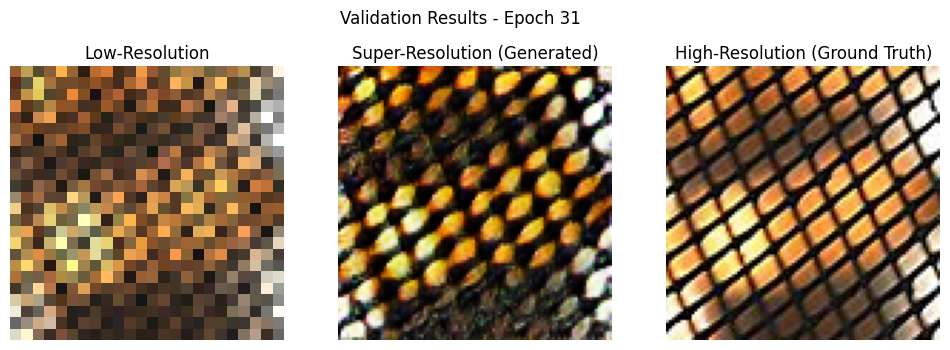

Validation: 100%|██████████| 1875/1875 [03:26<00:00,  9.07it/s]


Epoch [32/50]
  Train D Loss: 0.1692, G Loss: 18.1345, Content Loss: 14.3435, Adv Loss: 3.7910
  Val   D Loss: 0.2279, Content Loss: 23.0785, Adv Loss: 5.6726


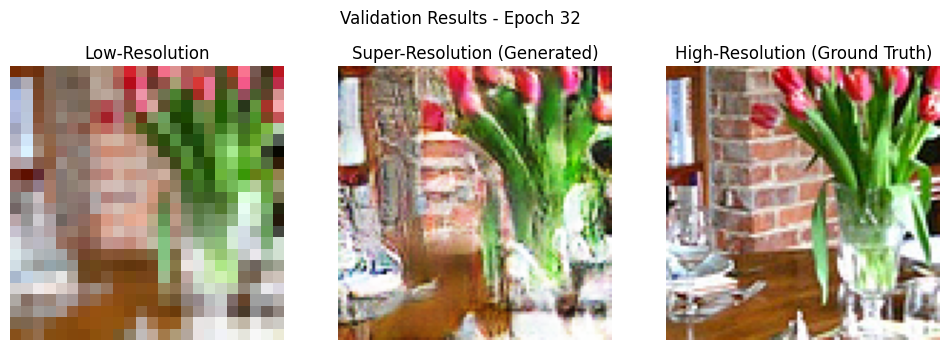

Saved checkpoints at epoch 32


Validation: 100%|██████████| 1875/1875 [03:26<00:00,  9.07it/s]


Epoch [33/50]
  Train D Loss: 0.1569, G Loss: 18.1761, Content Loss: 14.2346, Adv Loss: 3.9415
  Val   D Loss: 0.1762, Content Loss: 22.7983, Adv Loss: 2.8356


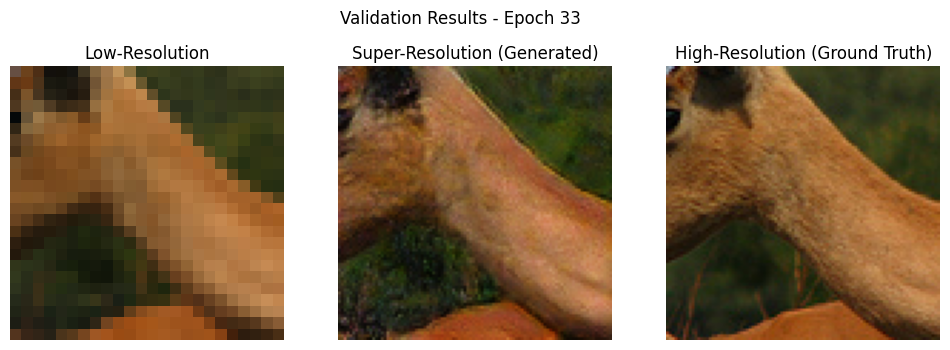

Validation: 100%|██████████| 1875/1875 [03:27<00:00,  9.05it/s]


Epoch [34/50]
  Train D Loss: 0.1515, G Loss: 18.4273, Content Loss: 14.4126, Adv Loss: 4.0148
  Val   D Loss: 0.1702, Content Loss: 22.4103, Adv Loss: 3.7171


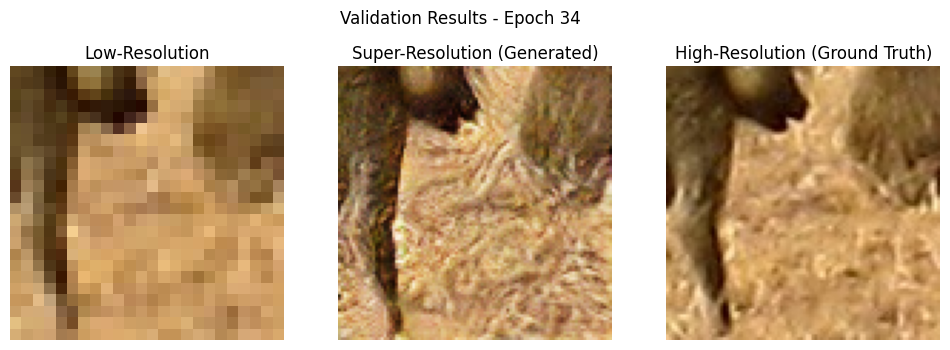

Saved checkpoints at epoch 34


Validation: 100%|██████████| 1875/1875 [03:27<00:00,  9.02it/s]


Epoch [35/50]
  Train D Loss: 0.1559, G Loss: 18.1492, Content Loss: 14.2040, Adv Loss: 3.9452
  Val   D Loss: 0.1705, Content Loss: 22.9560, Adv Loss: 2.7605


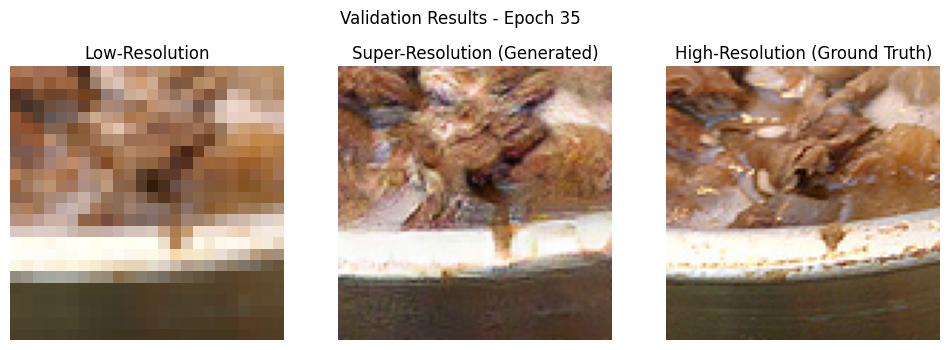

Validation: 100%|██████████| 1875/1875 [03:27<00:00,  9.03it/s]


Epoch [36/50]
  Train D Loss: 0.1521, G Loss: 18.2490, Content Loss: 14.2201, Adv Loss: 4.0289
  Val   D Loss: 0.0917, Content Loss: 22.6671, Adv Loss: 4.0326


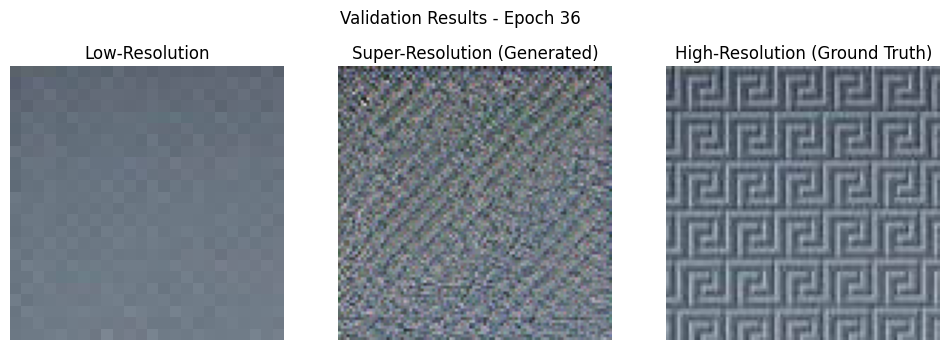

Saved checkpoints at epoch 36


Validation: 100%|██████████| 1875/1875 [03:28<00:00,  9.00it/s]


Epoch [37/50]
  Train D Loss: 0.1492, G Loss: 18.4026, Content Loss: 14.3438, Adv Loss: 4.0588
  Val   D Loss: 0.1614, Content Loss: 23.0858, Adv Loss: 6.0767


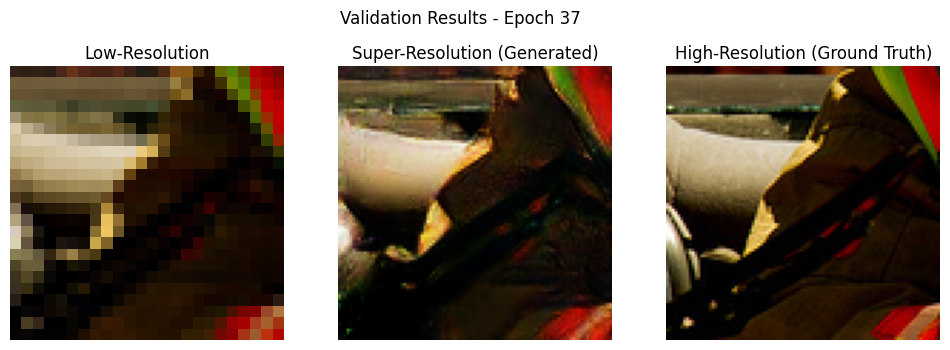

Validation: 100%|██████████| 1875/1875 [03:24<00:00,  9.16it/s]


Epoch [38/50]
  Train D Loss: 0.1476, G Loss: 18.2947, Content Loss: 14.2062, Adv Loss: 4.0885
  Val   D Loss: 0.1403, Content Loss: 22.8524, Adv Loss: 3.2024


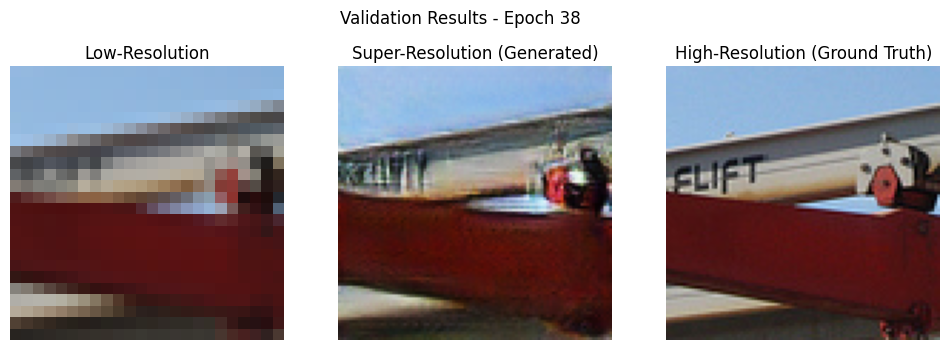

Saved checkpoints at epoch 38


Validation: 100%|██████████| 1875/1875 [03:23<00:00,  9.19it/s]


Epoch [39/50]
  Train D Loss: 0.1379, G Loss: 18.2879, Content Loss: 14.1828, Adv Loss: 4.1052
  Val   D Loss: 0.1116, Content Loss: 22.8813, Adv Loss: 5.0116


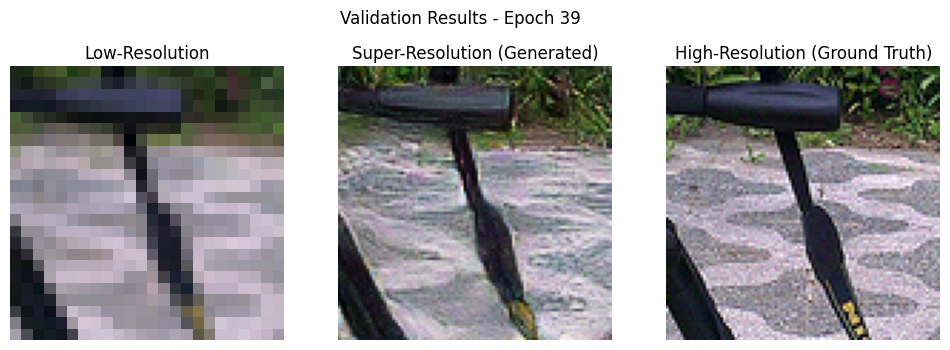

Validation: 100%|██████████| 1875/1875 [03:23<00:00,  9.21it/s]


Epoch [40/50]
  Train D Loss: 0.1340, G Loss: 18.4720, Content Loss: 14.2938, Adv Loss: 4.1782
  Val   D Loss: 0.1163, Content Loss: 22.8209, Adv Loss: 3.6610


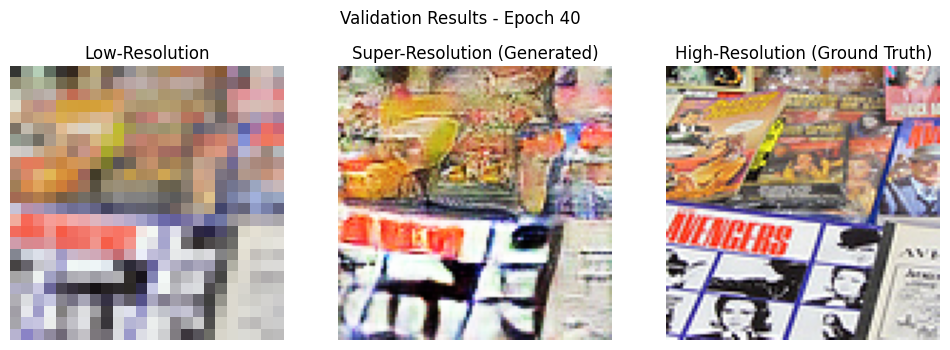

Saved checkpoints at epoch 40


Validation: 100%|██████████| 1875/1875 [03:24<00:00,  9.19it/s]


Epoch [41/50]
  Train D Loss: 0.1353, G Loss: 18.4884, Content Loss: 14.2662, Adv Loss: 4.2222
  Val   D Loss: 0.1267, Content Loss: 22.7104, Adv Loss: 4.3717


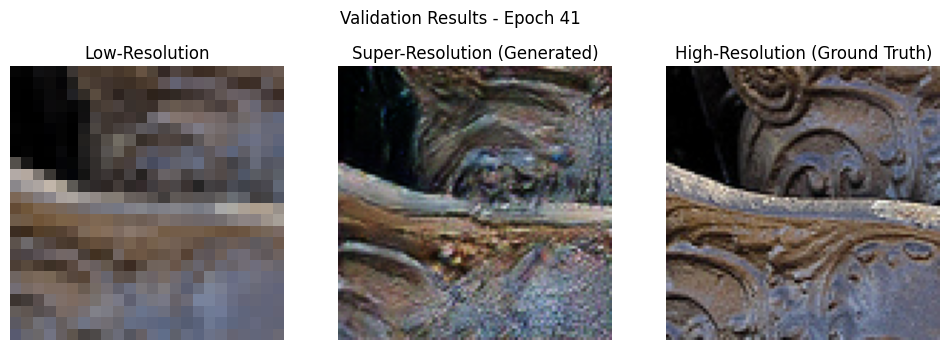

Validation: 100%|██████████| 1875/1875 [03:23<00:00,  9.20it/s]


Epoch [42/50]
  Train D Loss: 0.1342, G Loss: 18.2243, Content Loss: 14.0470, Adv Loss: 4.1774
  Val   D Loss: 0.0859, Content Loss: 22.7435, Adv Loss: 5.7895


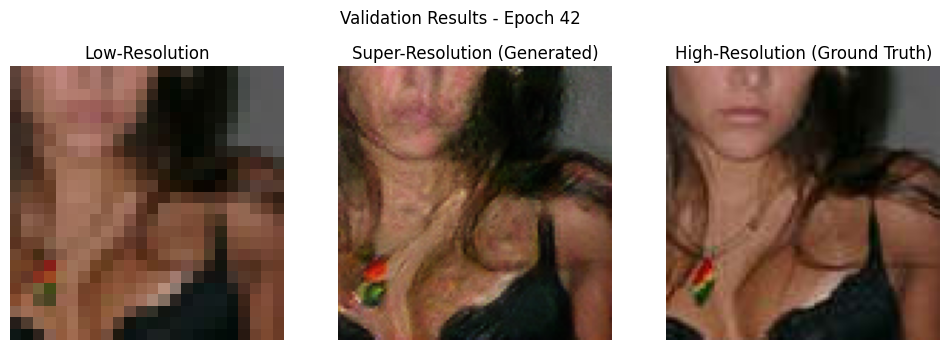

Saved checkpoints at epoch 42


Validation: 100%|██████████| 1875/1875 [03:23<00:00,  9.21it/s]


Epoch [43/50]
  Train D Loss: 0.1348, G Loss: 18.3203, Content Loss: 14.0673, Adv Loss: 4.2529
  Val   D Loss: 0.1145, Content Loss: 23.0866, Adv Loss: 3.9838


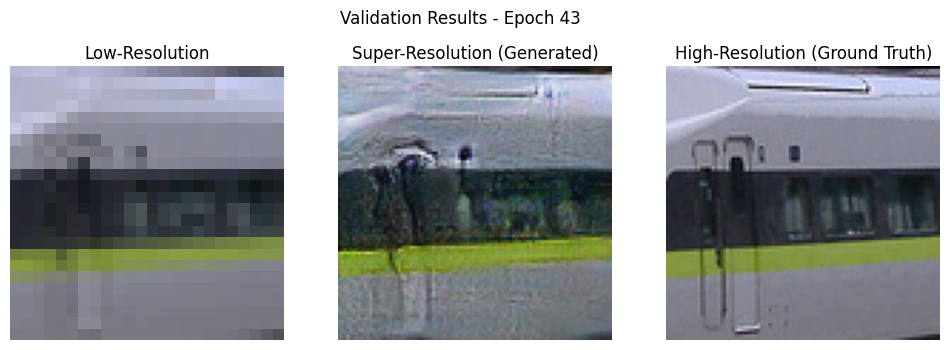

Validation: 100%|██████████| 1875/1875 [03:26<00:00,  9.10it/s]


Epoch [44/50]
  Train D Loss: 0.1366, G Loss: 18.3631, Content Loss: 14.0644, Adv Loss: 4.2987
  Val   D Loss: 0.1383, Content Loss: 22.6893, Adv Loss: 3.9930


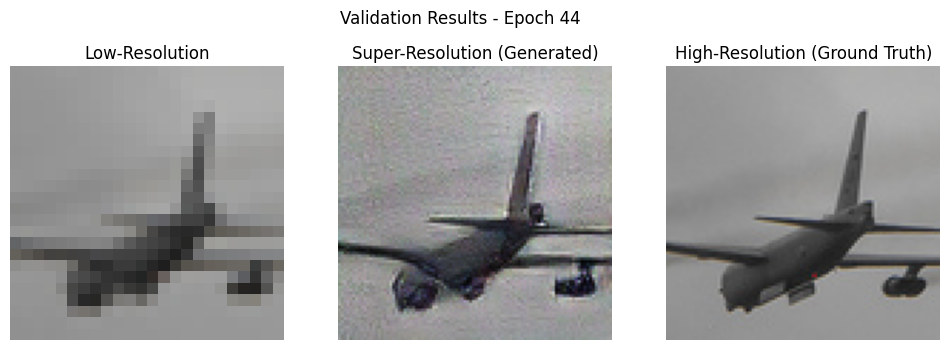

Saved checkpoints at epoch 44


Validation: 100%|██████████| 1875/1875 [03:27<00:00,  9.04it/s]


Epoch [45/50]
  Train D Loss: 0.1308, G Loss: 18.2195, Content Loss: 13.9631, Adv Loss: 4.2563
  Val   D Loss: 0.1709, Content Loss: 22.9299, Adv Loss: 5.0158


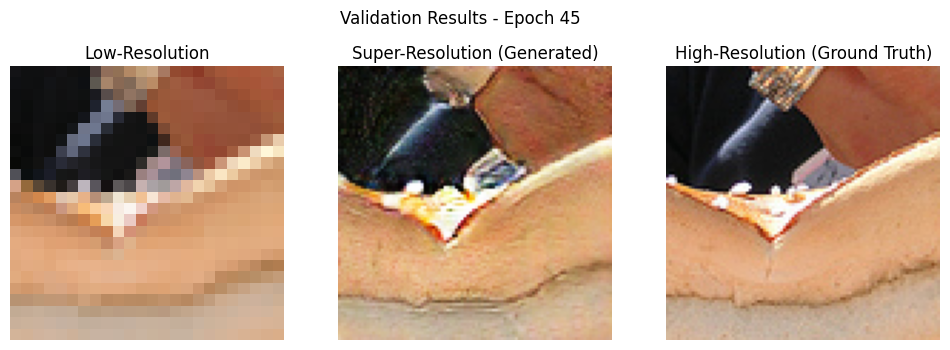

Validation: 100%|██████████| 1875/1875 [03:26<00:00,  9.08it/s]


Epoch [46/50]
  Train D Loss: 0.1311, G Loss: 18.3509, Content Loss: 14.0712, Adv Loss: 4.2796
  Val   D Loss: 0.1220, Content Loss: 22.3968, Adv Loss: 5.8094


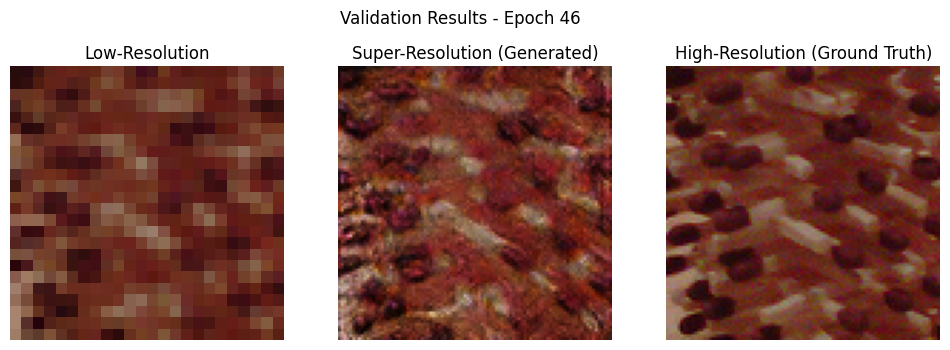

Saved checkpoints at epoch 46


Validation: 100%|██████████| 1875/1875 [03:24<00:00,  9.17it/s]


Epoch [47/50]
  Train D Loss: 0.1265, G Loss: 18.2544, Content Loss: 13.9511, Adv Loss: 4.3033
  Val   D Loss: 0.1245, Content Loss: 22.3173, Adv Loss: 4.3041


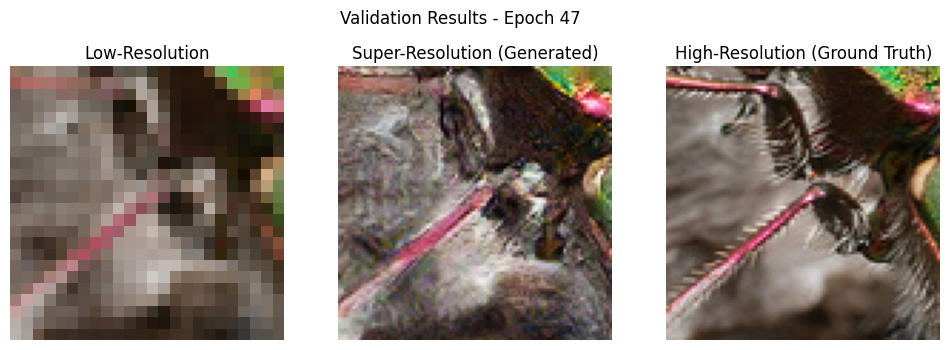

Validation: 100%|██████████| 1875/1875 [03:25<00:00,  9.14it/s]


Epoch [48/50]
  Train D Loss: 0.1226, G Loss: 18.4198, Content Loss: 14.0211, Adv Loss: 4.3987
  Val   D Loss: 0.1727, Content Loss: 22.3491, Adv Loss: 3.2793


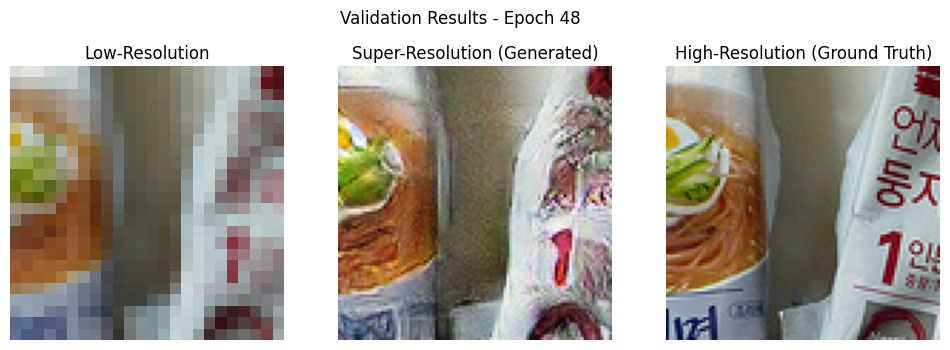

Saved checkpoints at epoch 48


Validation: 100%|██████████| 1875/1875 [03:21<00:00,  9.29it/s]


Epoch [49/50]
  Train D Loss: 0.1286, G Loss: 18.4318, Content Loss: 14.0773, Adv Loss: 4.3545
  Val   D Loss: 0.1001, Content Loss: 22.1972, Adv Loss: 4.9680


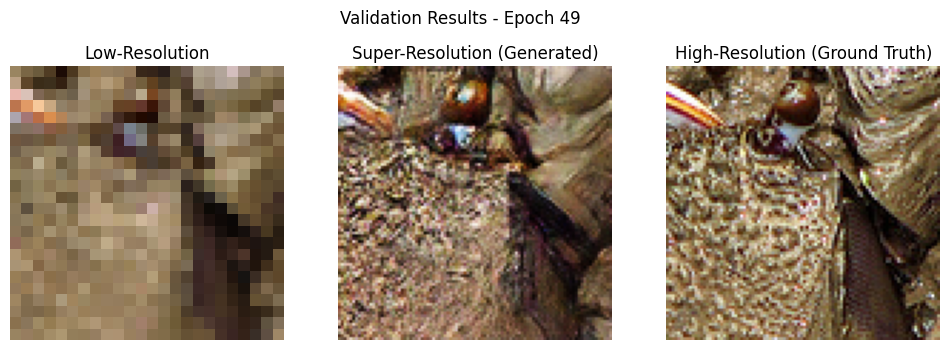

Validation: 100%|██████████| 1875/1875 [03:24<00:00,  9.19it/s]


Epoch [50/50]
  Train D Loss: 0.1205, G Loss: 18.3419, Content Loss: 13.9823, Adv Loss: 4.3596
  Val   D Loss: 0.0814, Content Loss: 22.4123, Adv Loss: 4.3983


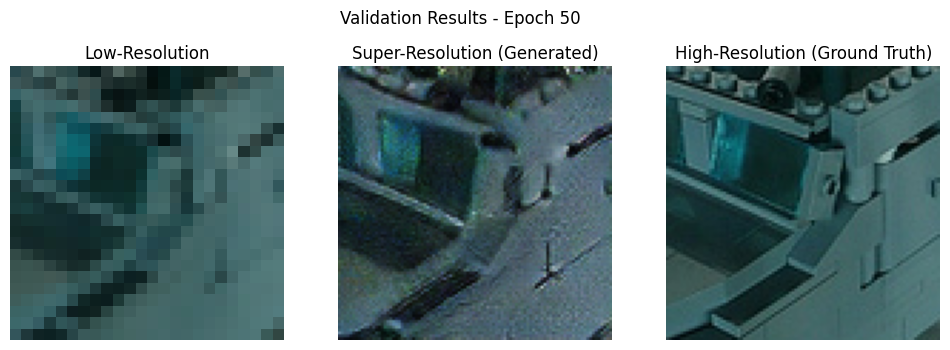

Saved checkpoints at epoch 50


In [14]:
num_epochs = 50
for epoch in range(num_epochs):
    generator.train()
    discriminator.train()

    train_d_loss, train_g_loss, train_content_loss, train_adv_loss = 0, 0, 0, 0
    for x_tensor, y_tensor in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
        x_tensor = x_tensor.to(device)
        y_tensor = y_tensor.to(device)

        ############################
        # Train Discriminator
        ############################
        
        optimizer_D.zero_grad()

        real_output = discriminator(y_tensor)
        real_labels = torch.ones_like(real_output).to(device)
        d_real_loss = bce_loss(real_output, real_labels)

        fake_images = generator(x_tensor).detach()
        fake_output = discriminator(fake_images)
        fake_labels = torch.zeros_like(fake_output).to(device)
        d_fake_loss = bce_loss(fake_output, fake_labels)

        d_loss = (d_real_loss + d_fake_loss) / 2
        d_loss.backward()
        optimizer_D.step()

        ############################
        # Train Generator
        ############################
        
        optimizer_G.zero_grad()

        fake_images = generator(x_tensor)
        fake_output = discriminator(fake_images)

        g_adv_loss = adversarial_loss(fake_output)
        g_content_loss = vgg_loss(fake_images, y_tensor)

        g_loss = g_content_loss + g_adv_loss
        g_loss.backward()
        optimizer_G.step()

        train_d_loss += d_loss.item()
        train_g_loss += g_loss.item()
        train_content_loss += g_content_loss.item()
        train_adv_loss += g_adv_loss.item()

    ############################
    # Validate Model
    ############################
    
    generator.eval()
    val_d_loss, val_content_loss, val_adv_loss = 0, 0, 0
    sample_lr, sample_sr, sample_hr = None, None, None
    with torch.no_grad():
        for x_tensor, y_tensor in tqdm(val_loader, desc="Validation"):
            x_tensor = x_tensor.to(device)
            y_tensor = y_tensor.to(device)

            real_output = discriminator(y_tensor)
            d_real_loss = bce_loss(real_output, torch.ones_like(real_output).to(device))

            fake_images = generator(x_tensor)
            fake_output = discriminator(fake_images)
            d_fake_loss = bce_loss(fake_output, torch.zeros_like(fake_output).to(device))
            d_loss = (d_real_loss + d_fake_loss) / 2

            g_adv_loss = adversarial_loss(fake_output)
            g_content_loss = vgg_loss(fake_images, y_tensor)

            val_d_loss += d_loss.item()
            val_content_loss += g_content_loss.item()
            val_adv_loss += g_adv_loss.item()

            if sample_lr is None:
                sample_lr = x_tensor.cpu()
                sample_sr = fake_images.cpu()
                sample_hr = y_tensor.cpu()

    train_d_loss /= len(train_loader)
    train_g_loss /= len(train_loader)
    train_content_loss /= len(train_loader)
    train_adv_loss /= len(train_loader)

    val_d_loss /= len(val_loader)
    val_content_loss /= len(val_loader)
    val_adv_loss /= len(val_loader)

    ############################
    # Logging
    ############################
    
    print(f"Epoch [{epoch+1}/{num_epochs}]")
    print(f"  Train D Loss: {train_d_loss:.4f}, G Loss: {train_g_loss:.4f}, Content Loss: {train_content_loss:.4f}, Adv Loss: {train_adv_loss:.4f}")
    print(f"  Val   D Loss: {val_d_loss:.4f}, Content Loss: {val_content_loss:.4f}, Adv Loss: {val_adv_loss:.4f}")

    ############################
    # Display Images After Validation
    ############################
    
    display_images(sample_lr, sample_sr, sample_hr, epoch)

    ############################
    # Save Models
    ############################
    
    if (epoch + 1) % 2 == 0:
        torch.save(generator.state_dict(), f"generator_epoch_{epoch+1}.pth")
        torch.save(discriminator.state_dict(), f"discriminator_epoch_{epoch+1}.pth")
        print(f"Saved checkpoints at epoch {epoch+1}")

In [15]:
torch.save(generator.state_dict(), 'SRGAN.pth')